In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
from os.path import join
import torch
import torch as th
import torch.nn.functional as F
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sys
sys.path.append("/n/home12/binxuwang/Github/DiffusionObjectRelation/PixArt-alpha")
from diffusion import IDDPM
from diffusion.data.builder import build_dataset, build_dataloader, set_data_root
from diffusion.model.builder import build_model
from diffusion.utils.misc import set_random_seed, read_config, init_random_seed, DebugUnderflowOverflow
sys.path.append("/n/home12/binxuwang/Github/DiffusionObjectRelation")
from utils.pixart_sampling_utils import pipeline_inference_custom, \
    PixArtAlphaPipeline_custom
from utils.pixart_utils import state_dict_convert
from utils.text_encoder_control_lib import RandomEmbeddingEncoder_wPosEmb
from utils.image_utils import pil_images_to_grid
from utils.attention_map_store_utils import replace_attn_processor, AttnProcessor2_0_Store, PixArtAttentionVisualizer_Store
from utils.cv2_eval_utils import find_classify_object_masks
from diffusers import AutoencoderKL, Transformer2DModel, PixArtAlphaPipeline, DPMSolverMultistepScheduler
from transformers import T5Tokenizer, T5EncoderModel

/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Pleas

In [ ]:
from transformers import T5Tokenizer, T5EncoderModel
from utils.pixart_utils import construct_diffuser_pipeline_from_config

In [15]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot"
config = read_config(join(savedir, 'config.py'))
# Build pipeline from config
pipeline = construct_diffuser_pipeline_from_config(config, pipeline_class=PixArtAlphaPipeline_custom)

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Expected types for transformer: (<class 'diffusers.models.transformers.pixart_transformer_2d.PixArtTransformer2DModel'>,), got <class 'diffusers.models.transformers.transformer_2d.Transformer2DModel'>.


In [16]:
ckptdir = join(savedir, "checkpoints")
ckpt = torch.load(join(ckptdir, "epoch_4000_step_160000.pth"), weights_only=True)
pipeline.transformer.load_state_dict(state_dict_convert(ckpt['state_dict_ema']))

<All keys matched successfully>

In [17]:
T5_path = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/output/pretrained_models/t5_ckpts/t5-v1_1-xxl"
tokenizer = T5Tokenizer.from_pretrained(T5_path, )#subfolder="tokenizer")

In [18]:
# text_feat_dir_old = '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/training_datasets/objectRel_pilot_rndemb/caption_feature_wmask'
text_feat_dir_old = '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/training_datasets/random_emd_dictionary'
emb_data = th.load(join(text_feat_dir_old, "word_embedding_dict.pt"))
rndpos_encoder = RandomEmbeddingEncoder_wPosEmb(emb_data["embedding_dict"], 
                                              emb_data["input_ids2dict_ids"], 
                                              emb_data["dict_ids2input_ids"], 
                                              max_seq_len=20, embed_dim=4096,
                                              wpe_scale=1/6).to("cuda")

/tmp/ipykernel_1096023/2229338268.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  emb_data = th.load(join(text_feat_dir_old, "word_embedding_dict.pt"))


In [25]:
config.mixed_precision 

'fp16'

In [26]:
weight_dtype = torch.float16
pipeline.tokenizer = tokenizer
pipeline.text_encoder = rndpos_encoder
pipeline.to(device="cuda", dtype=weight_dtype);

torch.Size([32, 20, 4096])
torch.Size([32, 20])


  0%|          | 0/14 [00:00<?, ?it/s]

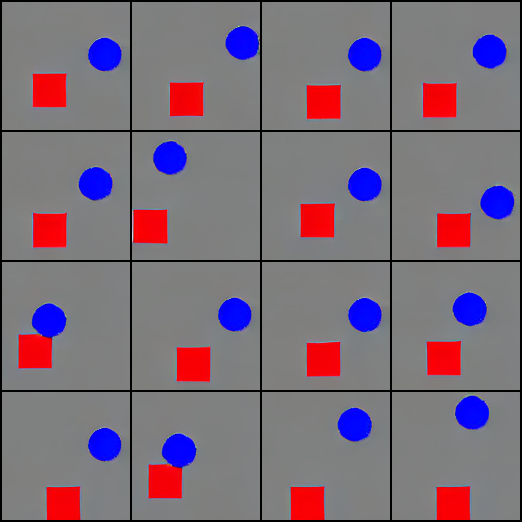

In [48]:
# attnvis_store.clear_activation()
prompt = "red square is below and to the left of the blue circle"
output = pipeline(prompt, 
        num_inference_steps=14,
        max_sequence_length=20, 
        num_images_per_prompt=16,
        return_sample_pred_traj=True,
        device="cuda")
noise_pred_traj, latents_traj, t_traj = output[1], output[2], output[3]
display(pil_images_to_grid(output[0].images))

### Visualizing sampling dynamics

In [54]:
from inspect import getsource
print(getsource(pipeline.scheduler.step))

    def step(
        self,
        model_output: torch.Tensor,
        timestep: Union[int, torch.Tensor],
        sample: torch.Tensor,
        generator=None,
        variance_noise: Optional[torch.Tensor] = None,
        return_dict: bool = True,
    ) -> Union[SchedulerOutput, Tuple]:
        """
        Predict the sample from the previous timestep by reversing the SDE. This function propagates the sample with
        the multistep DPMSolver.

        Args:
            model_output (`torch.Tensor`):
                The direct output from learned diffusion model.
            timestep (`int`):
                The current discrete timestep in the diffusion chain.
            sample (`torch.Tensor`):
                A current instance of a sample created by the diffusion process.
            generator (`torch.Generator`, *optional*):
                A random number generator.
            variance_noise (`torch.Tensor`):
                Alternative to generating noise with `generator`

In [55]:
from inspect import getsource
print(getsource(pipeline.scheduler.dpm_solver_first_order_update))

    def dpm_solver_first_order_update(
        self,
        model_output: torch.Tensor,
        *args,
        sample: torch.Tensor = None,
        noise: Optional[torch.Tensor] = None,
        **kwargs,
    ) -> torch.Tensor:
        """
        One step for the first-order DPMSolver (equivalent to DDIM).

        Args:
            model_output (`torch.Tensor`):
                The direct output from the learned diffusion model.
            sample (`torch.Tensor`):
                A current instance of a sample created by the diffusion process.

        Returns:
            `torch.Tensor`:
                The sample tensor at the previous timestep.
        """
        timestep = args[0] if len(args) > 0 else kwargs.pop("timestep", None)
        prev_timestep = args[1] if len(args) > 1 else kwargs.pop("prev_timestep", None)
        if sample is None:
            if len(args) > 2:
                sample = args[2]
            else:
                raise ValueError("missing `sample` as a

In [56]:
pipeline.scheduler.sigmas

tensor([157.4073,  78.7930,  41.1472,  22.8169,  13.2987,   8.0797,   5.1714,
          3.4430,   2.3525,   1.6472,   1.1494,   0.7854,   0.4957,   0.2447,
          0.0000])

In [59]:
alpha_t, sigma_t = pipeline.scheduler._sigma_to_alpha_sigma_t(pipeline.scheduler.sigmas)

In [62]:
len(alpha_t)

15

In [63]:
alpha_t

tensor([0.0064, 0.0127, 0.0243, 0.0438, 0.0750, 0.1228, 0.1899, 0.2789, 0.3912,
        0.5189, 0.6564, 0.7864, 0.8960, 0.9713, 1.0000])

In [60]:
sigma_t

tensor([1.0000, 0.9999, 0.9997, 0.9990, 0.9972, 0.9924, 0.9818, 0.9603, 0.9203,
        0.8548, 0.7544, 0.6177, 0.4441, 0.2377, 0.0000])

In [64]:
len(t_traj)

14

In [41]:
latents_traj.shape

torch.Size([15, 16, 4, 16, 16])

In [ ]:
alpha_t, sigma_t = pipeline.scheduler._sigma_to_alpha_sigma_t(pipeline.scheduler.sigmas)

In [69]:
sample_i = 1
noise_pred_traj[:, sample_i] # 14, 4, 16, 16
latents_traj[:, sample_i] # 15, 4, 16, 16
x0_pred_traj = (latents_traj[:-1, sample_i] - sigma_t[:-1, None, None, None] * noise_pred_traj[:, sample_i]) / alpha_t[:-1, None, None, None]

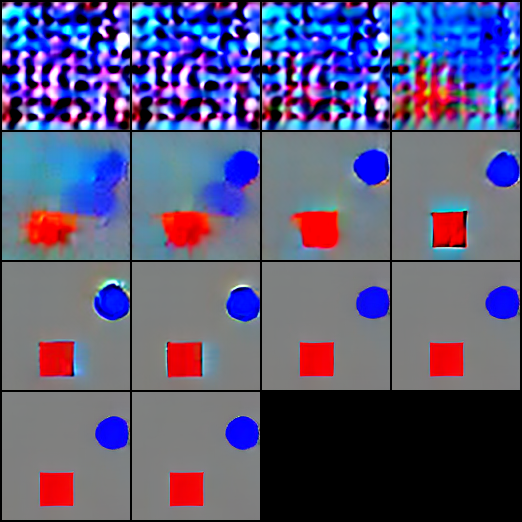

In [71]:
with torch.no_grad():
    x0_pred_traj_img_tsrs = pipeline.vae.decode(x0_pred_traj.half().cuda() / pipeline.vae.config.scaling_factor, return_dict=False)[0]

x0_pred_traj_imgs = pipeline.image_processor.postprocess(x0_pred_traj_img_tsrs, output_type="pil")
display(pil_images_to_grid(x0_pred_traj_imgs))

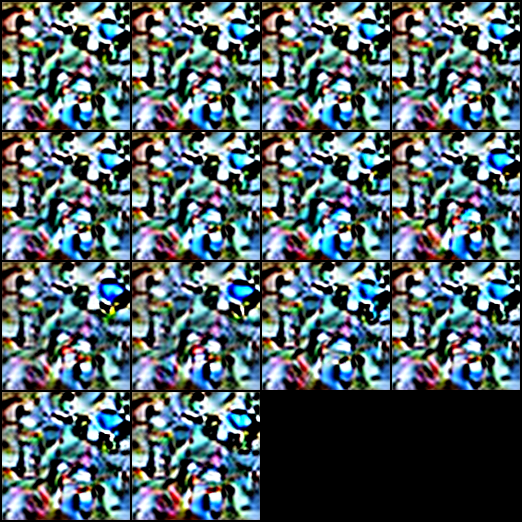

In [49]:
with torch.no_grad():
    noise_pred_traj_img_tsrs = pipeline.vae.decode(noise_pred_traj[:, 1].cuda() / pipeline.vae.config.scaling_factor, return_dict=False)[0]

noise_pred_traj_imgs = pipeline.image_processor.postprocess(noise_pred_traj_img_tsrs, output_type="pil")
display(pil_images_to_grid(noise_pred_traj_imgs))

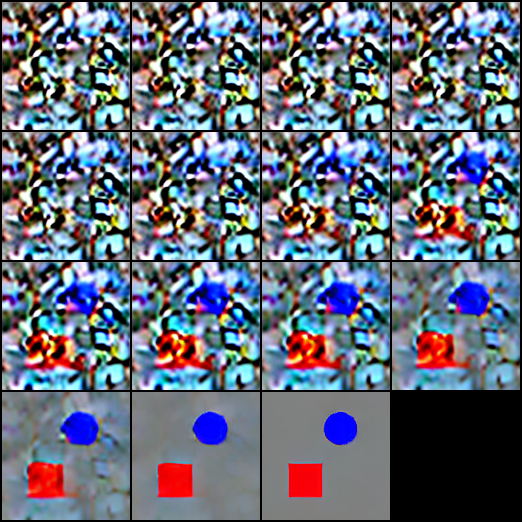

In [46]:
with torch.no_grad():
    pred_traj_img_tsrs = pipeline.vae.decode(latents_traj[:, 1].cuda() / pipeline.vae.config.scaling_factor, return_dict=False)[0]

pred_traj_imgs = pipeline.image_processor.postprocess(pred_traj_img_tsrs, output_type="pil")
display(pil_images_to_grid(pred_traj_imgs))

In [73]:
from utils.pixart_sampling_utils import latent_to_pil

t_traj length: 14
Alpha/sigma length: 15
Latents trajectory shape: torch.Size([15, 16, 4, 16, 16])


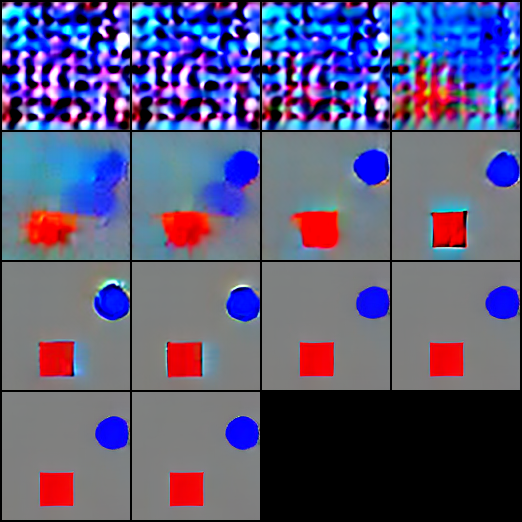

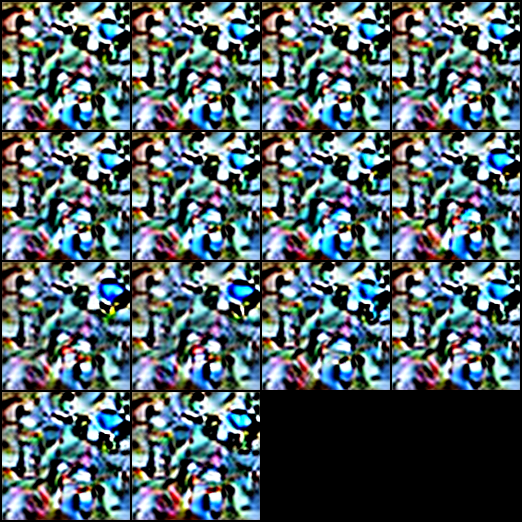

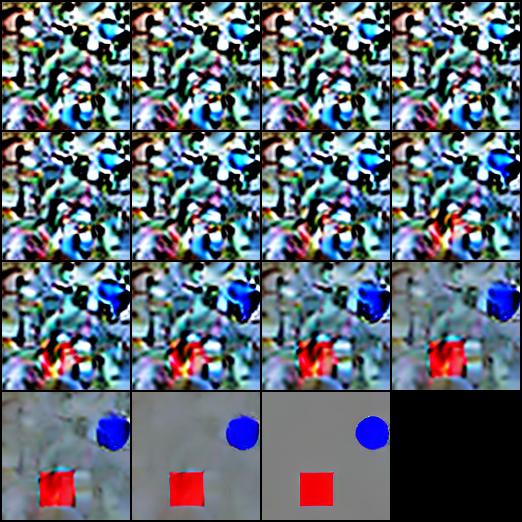

In [75]:
# Get scheduler parameters
alpha_t, sigma_t = pipeline.scheduler._sigma_to_alpha_sigma_t(pipeline.scheduler.sigmas)
# Debug info
print(f"t_traj length: {len(t_traj)}")
print(f"Alpha/sigma length: {len(alpha_t)}")
print(f"Latents trajectory shape: {latents_traj.shape}")
# Select sample to analyze
sample_i = 1
# Compute x0 predictions from latents and noise predictions
x0_pred_traj = (latents_traj[:-1, sample_i] - sigma_t[:-1, None, None, None] * noise_pred_traj[:, sample_i]) / alpha_t[:-1, None, None, None]
# Decode and visualize x0 predictions
x0_pred_traj_imgs = latent_to_pil(x0_pred_traj.cuda(), pipeline)
display(pil_images_to_grid(x0_pred_traj_imgs))
# Decode and visualize noise predictions
noise_pred_traj_imgs = latent_to_pil(noise_pred_traj[:, sample_i].cuda(), pipeline)
display(pil_images_to_grid(noise_pred_traj_imgs))
# Decode and visualize latent trajectory
pred_traj_imgs = latent_to_pil(latents_traj[:, sample_i].cuda(), pipeline)
display(pil_images_to_grid(pred_traj_imgs))

t_traj length: 14
Alpha/sigma length: 15
Latents trajectory shape: torch.Size([15, 16, 4, 16, 16])


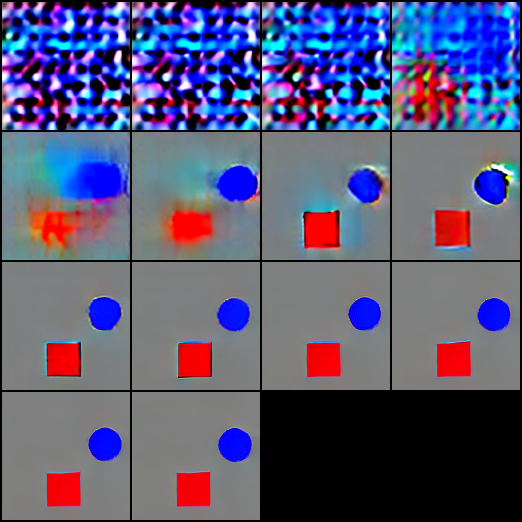

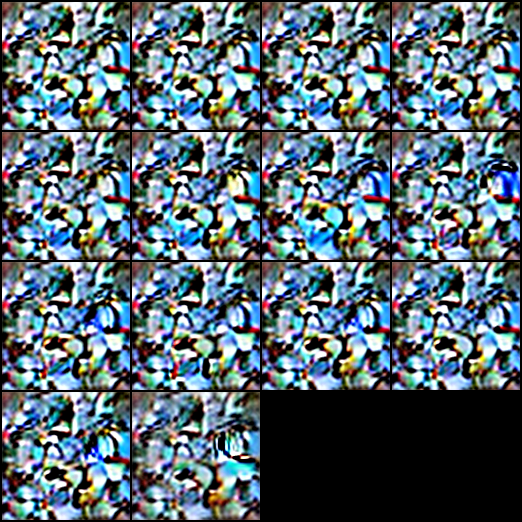

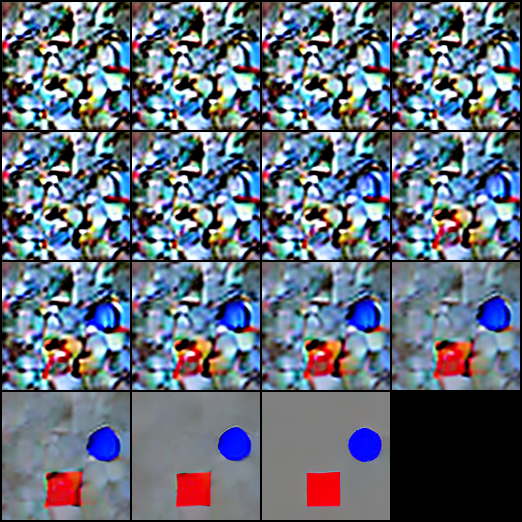

In [78]:
# Get scheduler parameters
alpha_t, sigma_t = pipeline.scheduler._sigma_to_alpha_sigma_t(pipeline.scheduler.sigmas)
# Debug info
print(f"t_traj length: {len(t_traj)}")
print(f"Alpha/sigma length: {len(alpha_t)}")
print(f"Latents trajectory shape: {latents_traj.shape}")
# Select sample to analyze
sample_i = 10
# Compute x0 predictions from latents and noise predictions
x0_pred_traj = (latents_traj[:-1, ] - sigma_t[:-1, None, None, None, None] * noise_pred_traj[:, ]) / alpha_t[:-1, None, None, None, None]
# Decode and visualize x0 predictions
x0_pred_traj_imgs = latent_to_pil(x0_pred_traj[:, sample_i].cuda(), pipeline)
display(pil_images_to_grid(x0_pred_traj_imgs))
# Decode and visualize noise predictions
noise_pred_traj_imgs = latent_to_pil(noise_pred_traj[:, sample_i].cuda(), pipeline)
display(pil_images_to_grid(noise_pred_traj_imgs))
# Decode and visualize latent trajectory
pred_traj_imgs = latent_to_pil(latents_traj[:, sample_i].cuda(), pipeline)
display(pil_images_to_grid(pred_traj_imgs))

### Combined version

torch.Size([18, 20, 4096])
torch.Size([18, 20])


  0%|          | 0/14 [00:00<?, ?it/s]

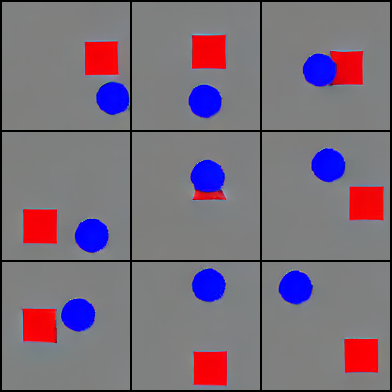

In [87]:
# attnvis_store.clear_activation()
# prompt = "red square is below and to the left of the blue circle"
# prompt_list = [f"red square is {relation_str} the blue circle" for relation_str in 
#                ["above", "below", "to the left of", "to the right of", 
#                 "above and to the left of", "above and to the right of", "below and to the left of", "below and to the right of"]]
prompt_list = [f"the red square is {relation_str} the blue circle" for relation_str in 
               ["above and to the left of", "above", "above and to the right of", 
                "to the left of", "", "to the right of", 
                "below and to the left of", "below", "below and to the right of"]]
output = pipeline(prompt_list, 
        num_inference_steps=14,
        max_sequence_length=20, 
        num_images_per_prompt=1,
        return_sample_pred_traj=True,
        generator=torch.Generator(device="cuda").manual_seed(0),
        device="cuda")
noise_pred_traj, latents_traj, t_traj = output[1], output[2], output[3]
display(pil_images_to_grid(output[0].images, ))

torch.Size([18, 20, 4096])
torch.Size([18, 20])


  0%|          | 0/14 [00:00<?, ?it/s]

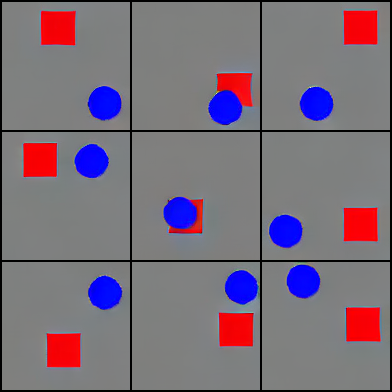

In [88]:
# attnvis_store.clear_activation()
# prompt = "red square is below and to the left of the blue circle"
# prompt_list = [f"red square is {relation_str} the blue circle" for relation_str in 
#                ["above", "below", "to the left of", "to the right of", 
#                 "above and to the left of", "above and to the right of", "below and to the left of", "below and to the right of"]]
prompt_list = [f"the red square is {relation_str} the blue circle" for relation_str in 
               ["above and to the left of", "above", "above and to the right of", 
                "to the left of", "", "to the right of", 
                "below and to the left of", "below", "below and to the right of"]]
output = pipeline(prompt_list, 
        num_inference_steps=14,
        max_sequence_length=20, 
        num_images_per_prompt=1,
        return_sample_pred_traj=True,
        generator=torch.Generator(device="cuda").manual_seed(10),
        device="cuda")
noise_pred_traj, latents_traj, t_traj = output[1], output[2], output[3]
display(pil_images_to_grid(output[0].images, ))

In [90]:
import os
from os.path import join

In [91]:
figdir = "/n/home12/binxuwang/Github/DiffusionObjectRelation/Figures/demo_figures"
os.makedirs(figdir, exist_ok=True)
pil_images_to_grid(output[0].images, ).save(join(figdir, "DiT-B_rndembpos_demo_8relations.png"))

In [92]:
# Get scheduler parameters
alpha_t, sigma_t = pipeline.scheduler._sigma_to_alpha_sigma_t(pipeline.scheduler.sigmas)
# Debug info
print(f"t_traj length: {len(t_traj)}")
print(f"Alpha/sigma length: {len(alpha_t)}")
print(f"Latents trajectory shape: {latents_traj.shape}")
# Compute x0 predictions from latents and noise predictions
x0_pred_traj = (latents_traj[:-1, ] - sigma_t[:-1, None, None, None, None] * noise_pred_traj[:, ]) / alpha_t[:-1, None, None, None, None]

t_traj length: 14
Alpha/sigma length: 15
Latents trajectory shape: torch.Size([15, 9, 4, 16, 16])


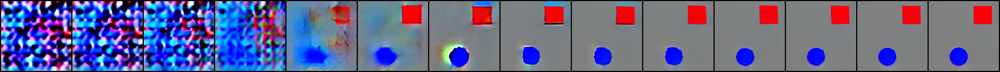

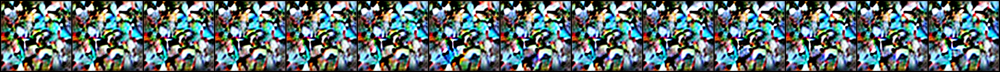

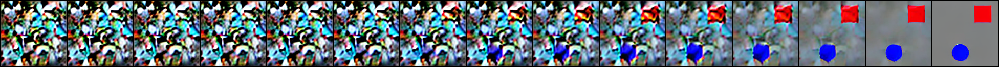

In [98]:
# Select sample to analyze
sample_i = 2
# Decode and visualize x0 predictions
x0_pred_traj_imgs = latent_to_pil(x0_pred_traj[:, sample_i].cuda(), pipeline)
mtg_x0 = pil_images_to_grid(x0_pred_traj_imgs, grid_size=(15,1))
mtg_x0.save(join(figdir, f"x0_pred_traj_imgs_{prompt_list[sample_i]}.png"))
display(mtg_x0)
# Decode and visualize noise predictions
noise_pred_traj_imgs = latent_to_pil(noise_pred_traj[:, sample_i].cuda(), pipeline)
mtg_noise = pil_images_to_grid(noise_pred_traj_imgs, grid_size=(15,1))
mtg_noise.save(join(figdir, f"noise_pred_traj_imgs_{prompt_list[sample_i]}.png"))
display(mtg_noise)
# Decode and visualize latent trajectory
latents_traj_imgs = latent_to_pil(latents_traj[:, sample_i].cuda(), pipeline)
mtg_xt = pil_images_to_grid(latents_traj_imgs, grid_size=(15,1))
mtg_xt.save(join(figdir, f"xt_traj_imgs_{prompt_list[sample_i]}.png"))
display(mtg_xt)

### Training dynamics

In [126]:
from PIL import Image
from os.path import join
import glob
import numpy as np
import re

In [123]:
figdir

'/n/home12/binxuwang/Github/DiffusionObjectRelation/Figures/demo_figures'

In [124]:
train_figdir = "/n/home12/binxuwang/Github/DiffusionObjectRelation/Figures/training_dynamics_figures"

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

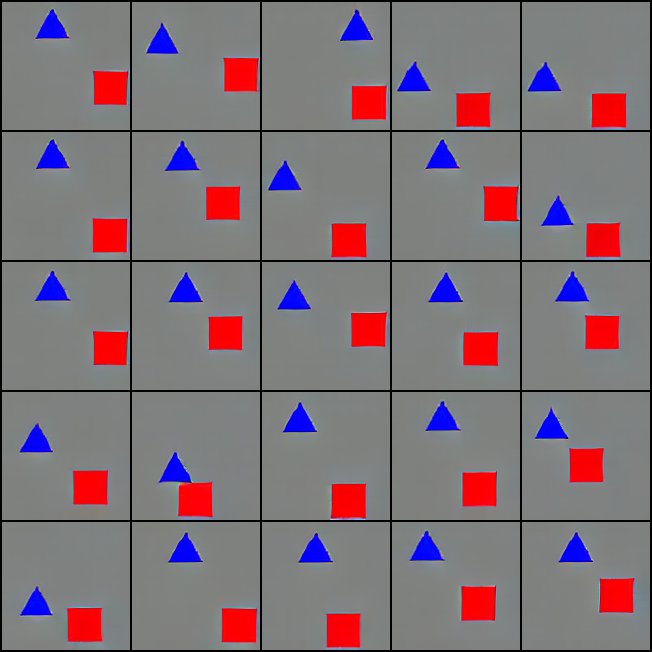

In [ ]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot"
sample_dir = join(savedir, "samples")

Image.open(join(sample_dir, "step_1_sample_blue_triangle_is_to_the_upper_left_of_red_square.png"))
# Find all step files matching the pattern
step_files = glob.glob(join(sample_dir, "step_*_sample_blue_triangle_is_to_the_upper_left_of_red_square.png"))

# Extract step numbers and sort files based on step number
step_files_with_numbers = []
for file in step_files:
    match = re.search(r'step_(\d+)_sample_', file)
    if match:
        step_number = int(match.group(1))
        step_files_with_numbers.append((step_number, file))

# Sort by step number
step_files_with_numbers.sort(key=lambda x: x[0])
step_files = [file for _, file in step_files_with_numbers]
step_numbers = [step_num for step_num, _ in step_files_with_numbers]

print(f"Found {len(step_files)} sample files")
print(f"Steps: {step_numbers}")
print(f"First few files: {step_files[:5]}")

Image.open(step_files[-1])

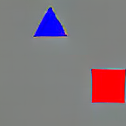

In [110]:
img = Image.open(step_files[-1])
img = img.crop((2, 2, 128, 128))
img

Sampled 14 steps out of 641 available
Sampled steps: [1, 500, 1000, 1750, 2750, 3750, 5000, 6750, 8500, 10750, 13250, 16500, 20250, 24750]


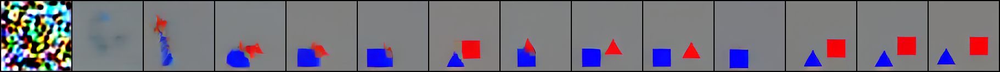

In [ ]:

# Sample step numbers in a logarithmic style
total_samples = 14
if not len(step_numbers) > total_samples:
    raise ValueError(f"Not enough steps to sample. Only {len(step_numbers)} steps available.")
min_step = min(step_numbers)
max_step = max(step_numbers)

# Create logarithmic sampling
log_space = np.logspace(0, 1, total_samples)  # from 1 to 10
# Scale to the range of available steps
sampled_indices = ((log_space - 1) / 9 * (len(step_numbers[:100]) - 1)).astype(int)
sampled_indices = np.unique(sampled_indices)  # Remove duplicates

sampled_step_numbers = [step_numbers[i] for i in sampled_indices]
sampled_files = [step_files[i] for i in sampled_indices]

print(f"Sampled {len(sampled_step_numbers)} steps out of {len(step_numbers)} available")
print(f"Sampled steps: {sampled_step_numbers}")

# Create a grid to display the sampled images
images = [Image.open(file) for file in sampled_files]

# Calculate grid dimensions
n_cols = min(5, len(images))
n_rows = (len(images) + n_cols - 1) // n_cols

# Crop images to remove borders and resize for display
cropped_images = []
for img in images:
    cropped = img.crop((2, 2, 128+2, 128+2))  # Remove 2px border, keep 126x126 content
    cropped_images.append(cropped)

display(pil_images_to_grid(cropped_images, grid_size=(15, 2)))

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

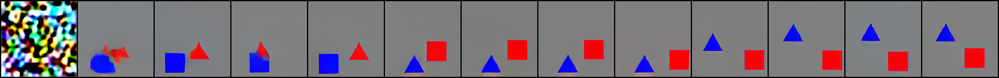

In [133]:
def get_logscale_training_trajectory(sample_dir, prompt_suffix, total_samples=14, max_step_num=80000):
    """
    Get a logarithmically sampled training trajectory from a sample directory.
    
    Args:
        sample_dir: Directory containing the sample files
        prompt_suffix: The prompt suffix to match in filenames (e.g., "blue_triangle_is_to_the_upper_left_of_red_square")
        total_samples: Number of samples to return in the trajectory
        max_steps: Maximum number of steps to consider for sampling
    
    Returns:
        tuple: (sampled_step_numbers, sampled_files, cropped_images)
    """
    # Find all step files matching the pattern
    step_files = glob.glob(join(sample_dir, f"step_*_sample_{prompt_suffix.replace(' ', '_')}.png"))

    # Extract step numbers and sort files based on step number
    step_files_with_numbers = []
    for file in step_files:
        match = re.search(r'step_(\d+)_sample_', file)
        if match:
            step_number = int(match.group(1))
            step_files_with_numbers.append((step_number, file))

    # Sort by step number
    step_files_with_numbers.sort(key=lambda x: x[0])
    step_files = [file for _, file in step_files_with_numbers]
    step_numbers = [step_num for step_num, _ in step_files_with_numbers]

    print(f"Found {len(step_files)} sample files")
    print(f"Steps: {step_numbers}")

    # Sample step numbers in a logarithmic style
    if not len(step_numbers) > total_samples:
        raise ValueError(f"Not enough steps to sample. Only {len(step_numbers)} steps available.")

    # Create logarithmic sampling
    log_space = np.logspace(0, 1, total_samples)  # from 1 to 10
    # Scale to the range of available steps (limited by max_steps)
    max_steps = (np.array(step_numbers) <= max_step_num).sum()
    available_steps = min(len(step_numbers), max_steps)
    sampled_indices = ((log_space - 1) / 9 * (available_steps - 1)).astype(int)
    sampled_indices = np.unique(sampled_indices)  # Remove duplicates

    sampled_step_numbers = [step_numbers[i] for i in sampled_indices]
    sampled_files = [step_files[i] for i in sampled_indices]

    print(f"Sampled {len(sampled_step_numbers)} steps out of {len(step_numbers)} available")
    print(f"Sampled steps: {sampled_step_numbers}")

    # Load and crop images
    images = [Image.open(file) for file in sampled_files]
    cropped_images = []
    for img in images:
        cropped = img.crop((2, 2, 128+2, 128+2))  # Remove 2px border, keep 126x126 content
        cropped_images.append(cropped)

    return sampled_step_numbers, sampled_files, cropped_images

# Example usage:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot"
sample_dir = join(savedir, "samples")

step_numbers, step_files, cropped_images = get_logscale_training_trajectory(
    sample_dir, 
    "blue_triangle_is_to_the_upper_left_of_red_square",
    total_samples=13,
    max_step_num=80000
)
print(step_numbers)
display(pil_images_to_grid(cropped_images, grid_size=(15, 1)))

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

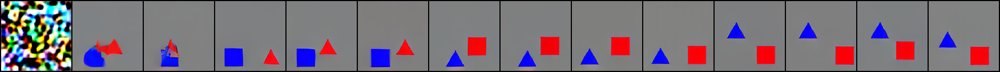

In [ ]:
step_numbers, step_files, cropped_images = get_logscale_training_trajectory(
    sample_dir, 
    "blue_triangle_is_to_the_upper_left_of_red_square",
    total_samples=14,
    max_step_num=75000
)
print(step_numbers)
display(pil_images_to_grid(cropped_images, grid_size=(15, 1)))

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

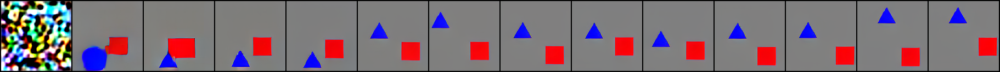

In [135]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_T5_DiT_B_pilot"
sample_dir = join(savedir, "samples")
step_numbers, step_files, cropped_images = get_logscale_training_trajectory(
    sample_dir, 
    "blue_triangle_is_to_the_upper_left_of_red_square",
    total_samples=14,
    max_step_num=75000
)
print(step_numbers)
display(pil_images_to_grid(cropped_images, grid_size=(15, 1)))

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

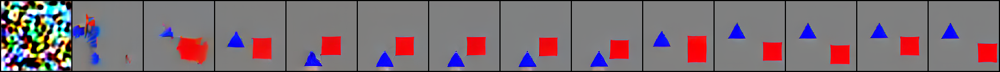

In [136]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_T5_DiT_mini_pilot"
sample_dir = join(savedir, "samples")
step_numbers, step_files, cropped_images = get_logscale_training_trajectory(
    sample_dir, 
    "blue_triangle_is_to_the_upper_left_of_red_square",
    total_samples=14,
    max_step_num=75000
)
print(step_numbers)
display(pil_images_to_grid(cropped_images, grid_size=(15, 1)))

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

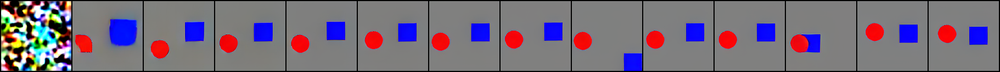

In [137]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_T5_DiT_B_pilot"
sample_dir = join(savedir, "samples")
step_numbers, step_files, cropped_images = get_logscale_training_trajectory(
    sample_dir, 
    "blue_square_is_to_the_right_of_red_circle",
    total_samples=14,
    max_step_num=75000
)
print(step_numbers)
display(pil_images_to_grid(cropped_images, grid_size=(15, 1)))

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

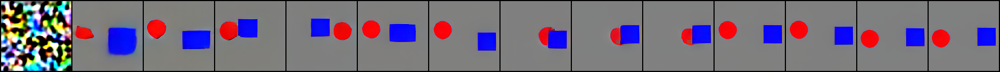

In [138]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_T5_DiT_B_pilot"
sample_dir = join(savedir, "samples")
step_numbers, step_files, cropped_images = get_logscale_training_trajectory(
    sample_dir, 
    "red_circle_is_to_the_left_of_blue_square",
    total_samples=14,
    max_step_num=75000
)
print(step_numbers)
display(pil_images_to_grid(cropped_images, grid_size=(15, 1)))

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

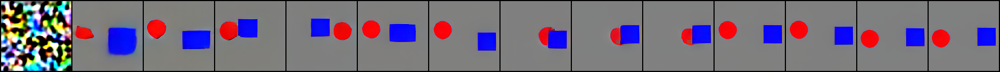

In [141]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_T5_DiT_B_pilot"
sample_dir = join(savedir, "samples")
step_numbers, step_files, cropped_images = get_logscale_training_trajectory(
    sample_dir, 
    "red_circle_is_to_the_left_of_blue_square",
    total_samples=14,
    max_step_num=75000
)
print(step_numbers)
display(pil_images_to_grid(cropped_images, grid_size=(15, 1)))

### Mass produce training dynamics plot

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

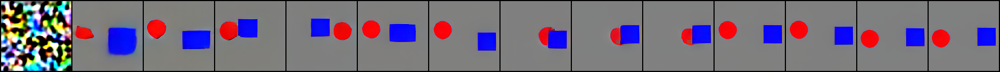

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

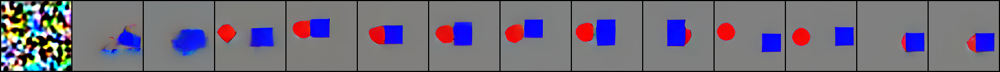

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

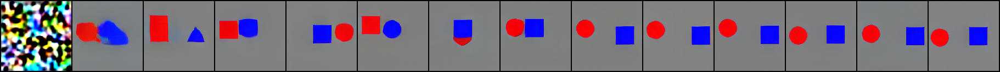

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

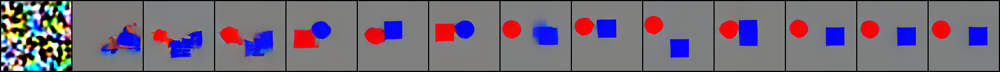

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

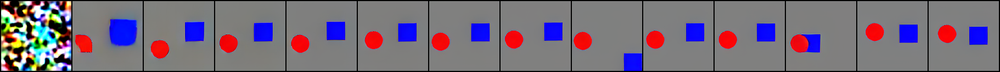

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

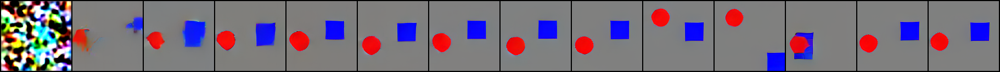

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

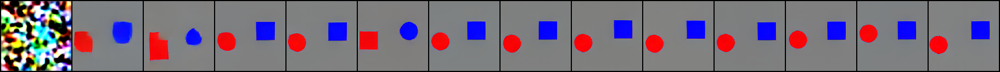

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

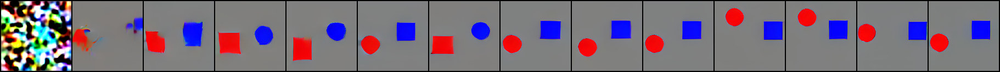

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

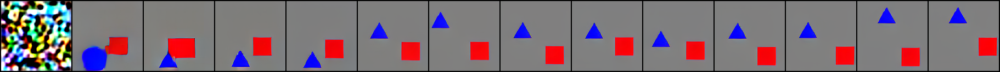

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

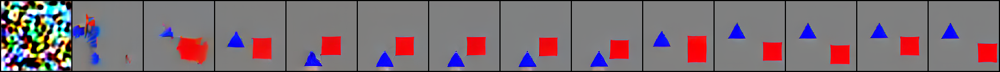

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

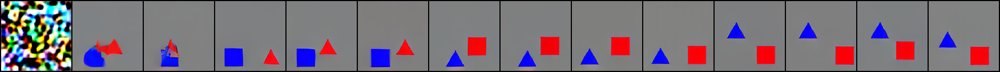

Found 641 sample files
Steps: [1, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000, 7250, 7500, 7750, 8000, 8250, 8500, 8750, 9000, 9250, 9500, 9750, 10000, 10250, 10500, 10750, 11000, 11250, 11500, 11750, 12000, 12250, 12500, 12750, 13000, 13250, 13500, 13750, 14000, 14250, 14500, 14750, 15000, 15250, 15500, 15750, 16000, 16250, 16500, 16750, 17000, 17250, 17500, 17750, 18000, 18250, 18500, 18750, 19000, 19250, 19500, 19750, 20000, 20250, 20500, 20750, 21000, 21250, 21500, 21750, 22000, 22250, 22500, 22750, 23000, 23250, 23500, 23750, 24000, 24250, 24500, 24750, 25000, 25250, 25500, 25750, 26000, 26250, 26500, 26750, 27000, 27250, 27500, 27750, 28000, 28250, 28500, 28750, 29000, 29250, 29500, 29750, 30000, 30250, 30500, 30750, 31000, 31250, 31500, 31750, 32000, 32250, 32500, 32750, 33000, 33250, 33500, 33750, 34000, 34250, 34500, 34750, 35000, 35250, 35500, 35750, 36000, 

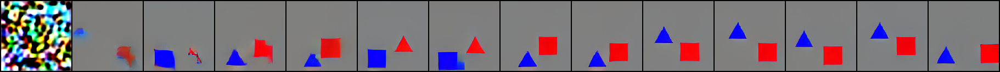

In [143]:

for prompt_suffix in ["red_circle_is_to_the_left_of_blue_square",
                        "blue_square_is_to_the_right_of_red_circle",
                        "blue_triangle_is_to_the_upper_left_of_red_square"]:
    for exprunname in ["objrel_T5_DiT_B_pilot", 
                    "objrel_T5_DiT_mini_pilot", 
                    "objrel_rndembdposemb_DiT_B_pilot",
                    "objrel_rndembdposemb_DiT_mini_pilot",]:
        savedir = f"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/{exprunname}"
        sample_dir = join(savedir, "samples")
        step_numbers, step_files, cropped_images = get_logscale_training_trajectory(
            sample_dir, 
            prompt_suffix,
            total_samples=14,
            max_step_num=75000
        )
        mtg = pil_images_to_grid(cropped_images, grid_size=(15, 1))
        mtg.save(join(train_figdir, f"training_dynamics_75ksteps_{exprunname}_{prompt_suffix}.png"))
        print(f"{exprunname} prompt: {prompt_suffix}")
        print(step_numbers)
        display(mtg)
        

### Scratch

In [72]:
if False:
    savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot"

    config = read_config(join(savedir, 'config.py'))

    weight_dtype = torch.float32
    if config.mixed_precision == "fp16": # accelerator.
        weight_dtype = torch.float16
    elif config.mixed_precision == "bf16": # accelerator.
        weight_dtype = torch.bfloat16
        
    image_size = config.image_size  # @param [256, 512, 1024]
    latent_size = int(image_size) // 8
    pred_sigma = getattr(config, 'pred_sigma', True)
    learn_sigma = getattr(config, 'learn_sigma', True) and pred_sigma
    model_kwargs={"window_block_indexes": config.window_block_indexes, "window_size": config.window_size,
                    "use_rel_pos": config.use_rel_pos, "lewei_scale": config.lewei_scale, 'config':config,
                    'model_max_length': config.model_max_length}
    # train_diffusion = IDDPM(str(config.train_sampling_steps), learn_sigma=learn_sigma, pred_sigma=pred_sigma, snr=config.snr_loss)
    model = build_model(config.model,
                    config.grad_checkpointing,
                    config.get('fp32_attention', False),
                    input_size=latent_size,
                    learn_sigma=learn_sigma,
                    pred_sigma=pred_sigma,
                    **model_kwargs).train()

    transformer = Transformer2DModel(
            sample_size=image_size // 8,
            num_layers=len(model.blocks),
            attention_head_dim=model.blocks[0].hidden_size // model.num_heads,
            in_channels=model.in_channels,
            out_channels=model.out_channels,
            patch_size=model.patch_size,
            attention_bias=True,
            num_attention_heads=model.num_heads,
            cross_attention_dim=model.blocks[0].hidden_size,
            activation_fn="gelu-approximate",
            num_embeds_ada_norm=1000,
            norm_type="ada_norm_single",
            norm_elementwise_affine=False,
            norm_eps=1e-6,
            caption_channels=4096,
    )
    # state_dict = state_dict_convert(all_state_dict.pop("state_dict"))
    transformer.load_state_dict(state_dict_convert(model.state_dict()))
    pipeline = PixArtAlphaPipeline_custom.from_pretrained(
        "PixArt-alpha/PixArt-XL-2-512x512",
        transformer=transformer,
        tokenizer=None,
        text_encoder=None,
        torch_dtype=weight_dtype,
    )

In [ ]:
# Get scheduler parameters
alpha_t, sigma_t = pipeline.scheduler._sigma_to_alpha_sigma_t(pipeline.scheduler.sigmas)
# Debug info
print(f"t_traj length: {len(t_traj)}")
print(f"Alpha/sigma length: {len(alpha_t)}")
print(f"Latents trajectory shape: {latents_traj.shape}")
# Select sample to analyze
sample_i = 1
# Compute x0 predictions from latents and noise predictions
x0_pred_traj = (latents_traj[:-1, sample_i] - sigma_t[:-1, None, None, None] * noise_pred_traj[:, sample_i]) / alpha_t[:-1, None, None, None]
# Decode and visualize x0 predictions
with torch.no_grad():
    x0_pred_traj_img_tsrs = pipeline.vae.decode(x0_pred_traj.half().cuda() / pipeline.vae.config.scaling_factor, return_dict=False)[0]

x0_pred_traj_imgs = pipeline.image_processor.postprocess(x0_pred_traj_img_tsrs, output_type="pil")
display(pil_images_to_grid(x0_pred_traj_imgs))

# Decode and visualize noise predictions
with torch.no_grad():
    noise_pred_traj_img_tsrs = pipeline.vae.decode(noise_pred_traj[:, sample_i].cuda() / pipeline.vae.config.scaling_factor, return_dict=False)[0]

noise_pred_traj_imgs = pipeline.image_processor.postprocess(noise_pred_traj_img_tsrs, output_type="pil")
display(pil_images_to_grid(noise_pred_traj_imgs))

# Decode and visualize latent trajectory
with torch.no_grad():
    pred_traj_img_tsrs = pipeline.vae.decode(latents_traj[:, sample_i].cuda() / pipeline.vae.config.scaling_factor, return_dict=False)[0]

pred_traj_imgs = pipeline.image_processor.postprocess(pred_traj_img_tsrs, output_type="pil")
display(pil_images_to_grid(pred_traj_imgs))